In [50]:
import librosa
import numpy as np
import matplotlib.pyplot as plt
import os
import umap
import IPython
from numpy.random._examples.cffi.extending import rng

In [51]:
def getAllBirds(path):
    species = os.listdir(data)
    paths = []
    labels = []

    for i, specie in enumerate(species):
        species_paths = os.listdir(os.path.join(data, specie))
        for path in species_paths[:100]:
            paths.append(os.path.join(data, specie, path))
            labels.append(specie)

    return paths, labels

In [52]:
MAX_DURATION_IN_SAMPLES = 250000

def getEmbedings(path):

    paths, labels = getAllBirds(path)

    embeds = []
    count = 0
    for path in paths:
        y, sr = librosa.load(path, sr=None)
        if y.shape[0] > MAX_DURATION_IN_SAMPLES:
            begin = rng.integers(0, y.shape[0] - MAX_DURATION_IN_SAMPLES)
            y = y[begin: begin + MAX_DURATION_IN_SAMPLES]
        spec = librosa.feature.melspectrogram(
            y=y,
            sr=sr,
            n_mels=64,
            n_fft=int(sr * 0.02),
            hop_length=int(sr * 0.01),
            fmax=12000,
            fmin=150
        )
        embeds.append(librosa.util.normalize(np.mean(spec, axis=1)))
        if count % 100 == 0:
            print('Processed: ' + str(count))
        count += 1

    embeds = np.array(embeds)
    return embeds, labels

In [53]:
data = 'C:/Users/vovak/PycharmProjects/ML/labs/lab4/Ptichki'
embeds, labels = getEmbedings(data)


Processed: 0
Processed: 100
Processed: 200
Processed: 300
Processed: 400
Processed: 500
Processed: 600
Processed: 700
Processed: 800
Processed: 900
Processed: 1000
Processed: 1100
Processed: 1200
Processed: 1300
Processed: 1400
Processed: 1500
Processed: 1600
Processed: 1700
Processed: 1800
Processed: 1900
Processed: 2000
Processed: 2100
Processed: 2200
Processed: 2300
Processed: 2400
Processed: 2500
Processed: 2600
Processed: 2700
Processed: 2800
Processed: 2900
Processed: 3000
Processed: 3100
Processed: 3200
Processed: 3300
Processed: 3400
Processed: 3500
Processed: 3600
Processed: 3700
Processed: 3800


In [ ]:
labels = np.array(labels)
unique_labels = np.array(['norcar', 'normoc', 'rocwre', 'rusbla', 'rudduc', 'rthhum'])
colors = plt.cm.rainbow(np.linspace(0, 1, len(unique_labels)))

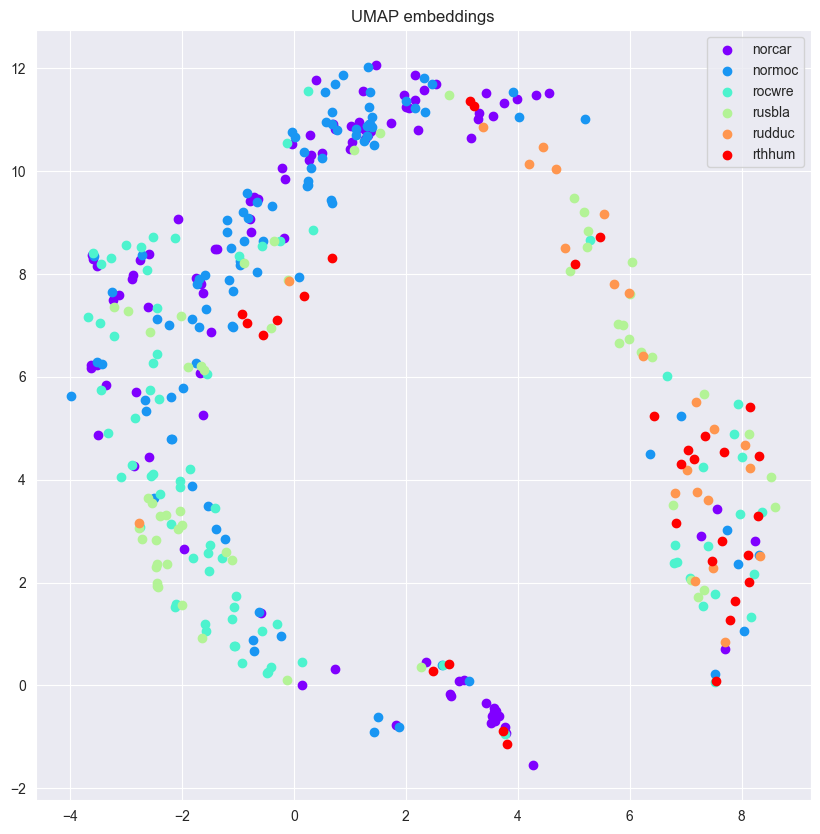

In [54]:
embeds_with_2 = umap.UMAP().fit_transform(embeds)
points_x = []
points_y = []
plt.figure(figsize=(10, 10))
for i, color in enumerate(colors):
    points_x.append(np.transpose(embeds_with_2[np.where(labels == unique_labels[i])])[0])
    points_y.append(np.transpose(embeds_with_2[np.where(labels == unique_labels[i])])[1])
    plt.scatter(points_x[i], points_y[i], color=color, label=unique_labels[i])
plt.title('UMAP embeddings')
plt.legend()
plt.show()

In [55]:
def printAudio(aud):
    wf, sr = librosa.load(aud)
    plt.figure(figsize=(20, 4))
    plt.plot(wf)
    plt.show()
    mel_spec = librosa.feature.melspectrogram(y=wf, sr=sr, n_mels=256)
    plt.figure(figsize=(12, 4))
    librosa.display.specshow(librosa.power_to_db(mel_spec, ref=np.max), y_axis='mel', x_axis='time');
    plt.title('Mel spectrogram')
    plt.colorbar()
    plt.show()

#### Птицы normoc и norcar довольно похожи

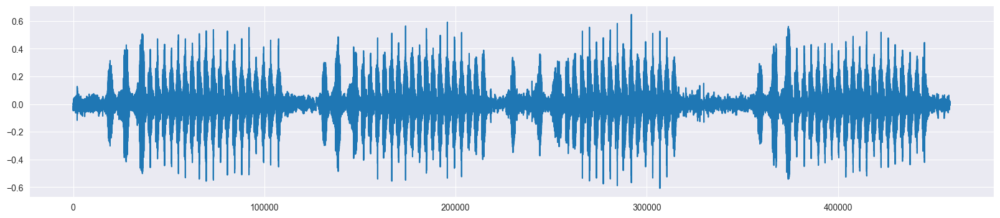

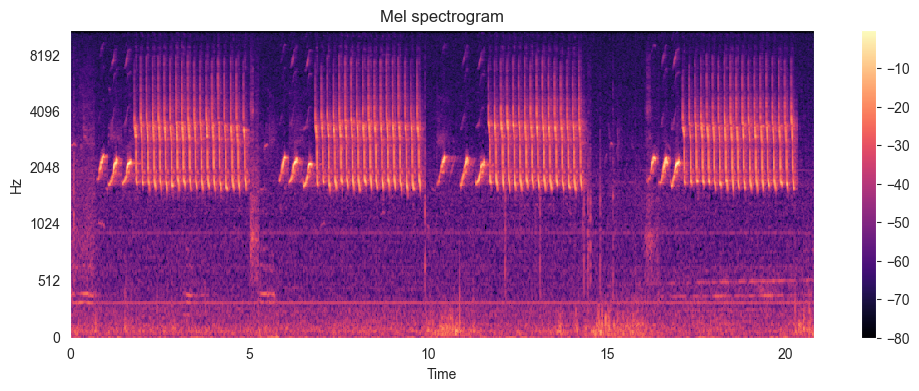

In [56]:
bird = 'Ptichki/norcar/XC11846.wav'
printAudio(bird)
IPython.display.Audio(bird)

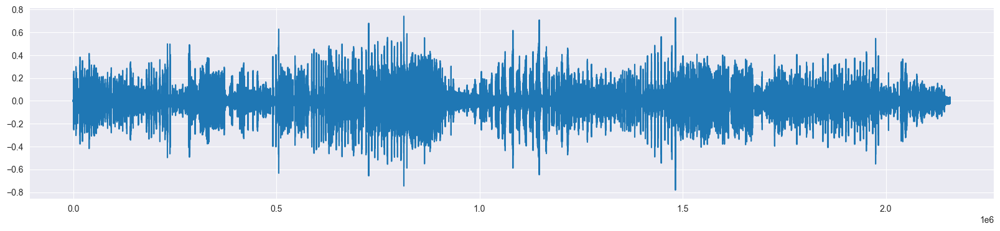

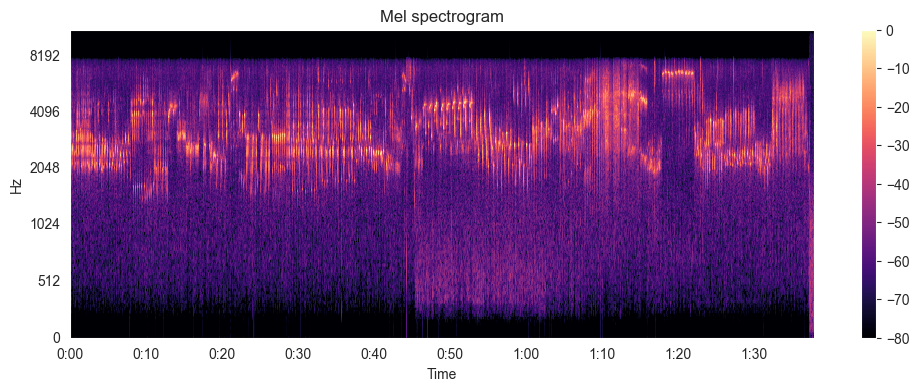

In [57]:
bird = 'Ptichki/normoc/XC54018.wav'
printAudio(bird)
IPython.display.Audio(bird  )

#### Птицы rudduc и rthhum тоже

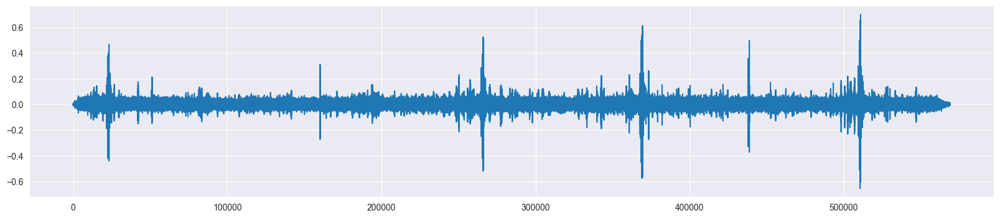

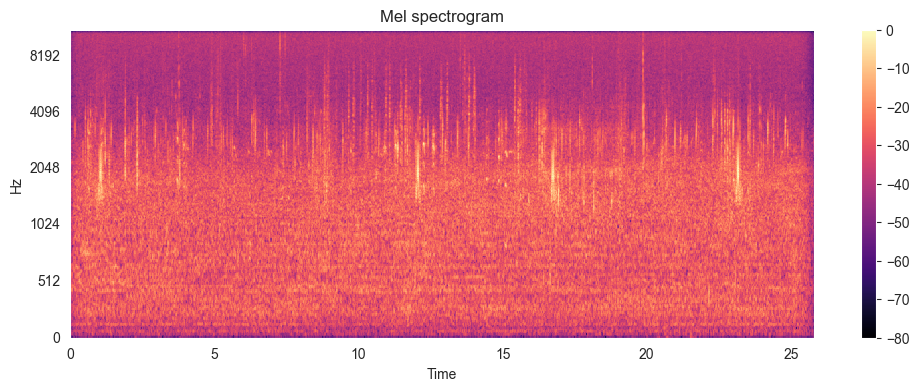

In [58]:
bird = 'Ptichki/rudduc/XC452497.wav'
printAudio(bird)
IPython.display.Audio(bird  )

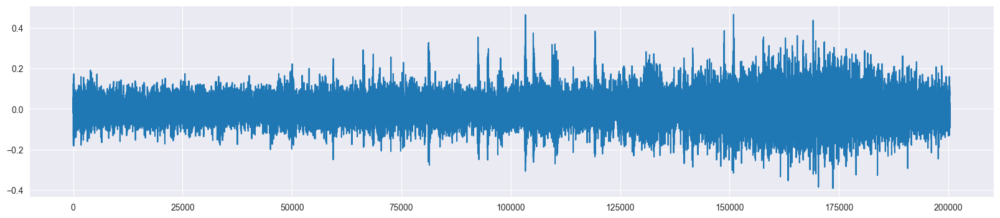

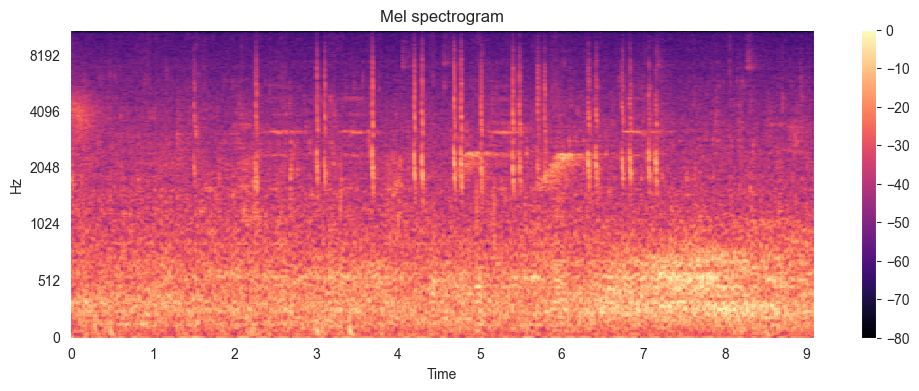

In [59]:
bird = 'Ptichki/rthhum/XC17055.wav'
printAudio(bird)
IPython.display.Audio(bird  )